In [9]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from matplotlib.collections import LineCollection
import matplotlib.patches as patches

from IS2ML_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [77]:
fn_features = 'data_paper/lake_segments_depth_features.parquet'
fn_info = 'data_paper/lake_segments_info.parquet'

df_feat = pd.read_parquet(fn_features)
df_info = pd.read_parquet(fn_info)

In [80]:
idxs = [3, 4, 5, 8, 11, 12, 14, 16, 46, 71, 74, 80]
test_ids = df_info.index[idxs]
is_test = df_feat.apply(lambda x: x.IS2_id in test_ids, axis=1)
df_feat_test = df_feat[is_test]
df_feat_train_full = df_feat[~is_test]
depth_test = df_feat_test.depth
pred_test = df_feat_test.iloc[:, 6:]

In [86]:
frac_train = 1.0
n_estimators = 500
max_features = 0.5
max_samples = 0.2

print('frac_train = %g\nn_estimators = %g\nmax_features = %g\nmax_samples = %g' % (frac_train, n_estimators, max_features, max_samples))

df_feat_train = df_feat_train_full.sample(frac=frac_train, replace=False)
depth_train = df_feat_train.depth
pred_train = df_feat_train.iloc[:, 6:]

# Random Forest Regression
print('training...', end=' ')
start_time = time.time()
rf = RandomForestRegressor(n_estimators=n_estimators, criterion='squared_error',# random_state=42, 
                           max_features=max_features, max_samples=max_samples, n_jobs=-1)
rf.fit(pred_train, depth_train)
print('finished in %s' % duration_string(time.time() - start_time))

print('fitting...', end=' ')
start_time = time.time()
depth_pred = rf.predict(pred_test)
print('finished in %s' % duration_string(time.time() - start_time))

# Predictions and evaluation
mae = mean_absolute_error(depth_test, depth_pred)
mse = mean_squared_error(depth_test, depth_pred)
bias = np.nanmean(depth_test - depth_pred)
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Mean Bias: {bias}')

df_result_test = df_feat_test.copy()
df_result_test['depth_pred'] = depth_pred

frac_train = 1
n_estimators = 500
max_features = 0.5
max_samples = 0.2
training... finished in 2 mins, 28 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.39900850971018276
Mean Squared Error: 0.39634562516730903
Mean Bias: 0.16515531082479243


In [67]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    rf, pred_test, depth_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {duration_string(elapsed_time)} seconds")

forest_importances = pd.Series(result.importances_mean, index=list(pred_test))

matplotlib.rcParams.update({'font.size': 7})
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, tick_label=list(pred_test), ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

/Users/parndt/anaconda3/envs/eeicelakes-env/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Elapsed time to compute the importances: 63.464 seconds


In [68]:
forest_importances

0     0.003950
1     0.008036
2     0.220546
3     0.002361
4     0.016680
        ...   
57    0.077608
58    0.451396
59    0.011622
60    0.257275
61    0.200614
Length: 62, dtype: float64

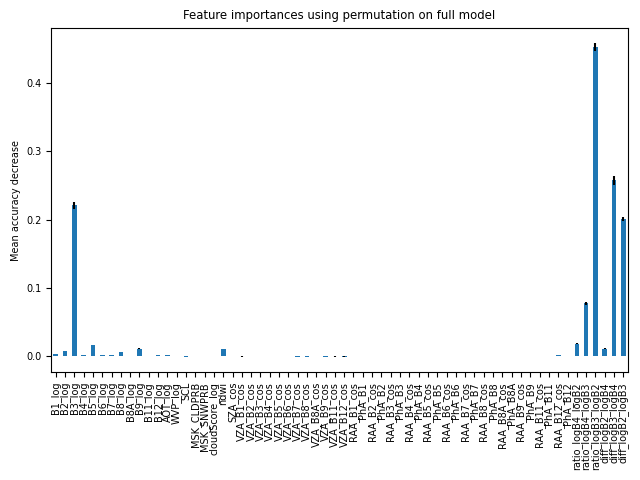

In [ ]:
# frac_train = 1
# n_estimators = 300
# max_features = 0.5
# training... finished in 1 hrs, 26 mins, 19 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.4024154411221477
# Mean Squared Error: 0.41666215642674453
# Mean Bias: 0.15877720149604335

In [60]:
# frac_train = 0.2
# n_estimators = 200
# max_features = 0.5
# training... finished in 8 mins, 59 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.41526102442672636
# Mean Squared Error: 0.4412601033120553
# Mean Bias: 0.17698143518595236

In [61]:
# frac_train = 0.05
# n_estimators = 100
# max_features = 0.5
# training... finished in 48 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.5039408774788092
# Mean Squared Error: 0.7708028309580067
# Mean Bias: 0.22040550307460657

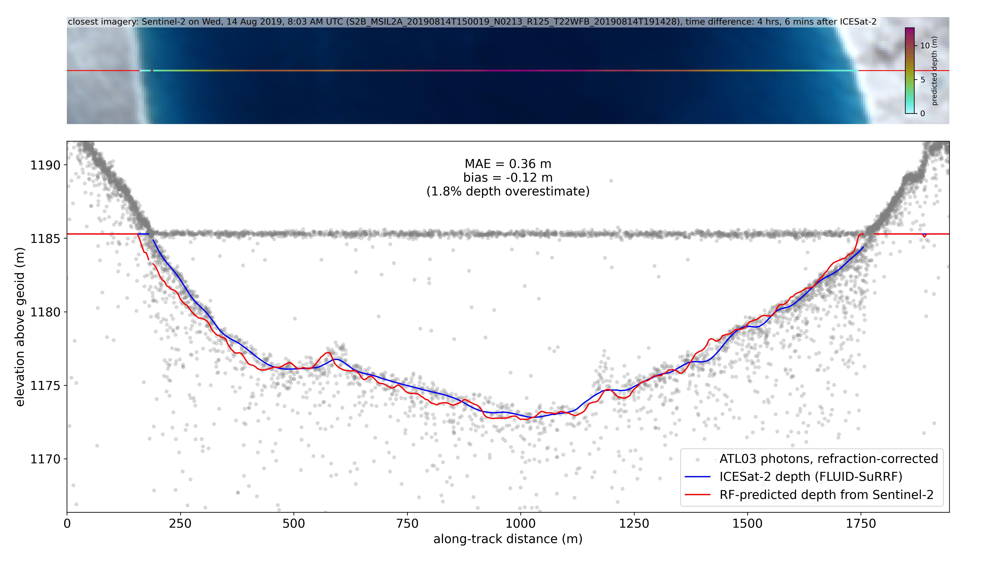

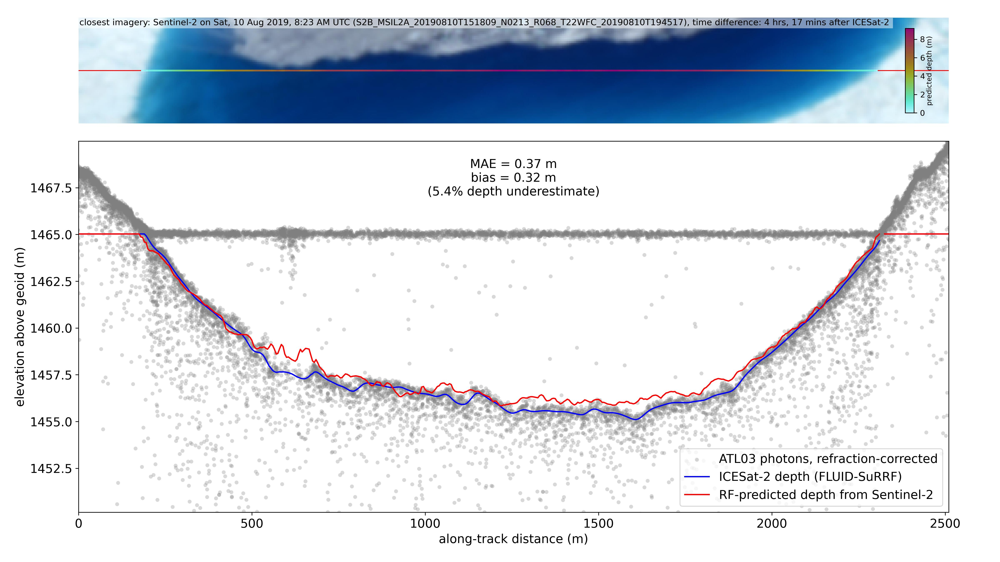

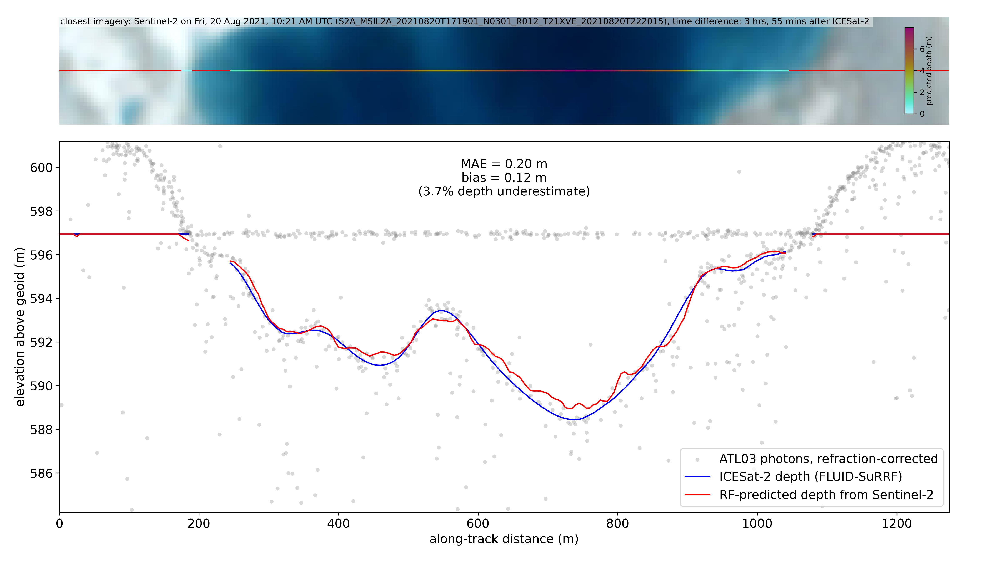

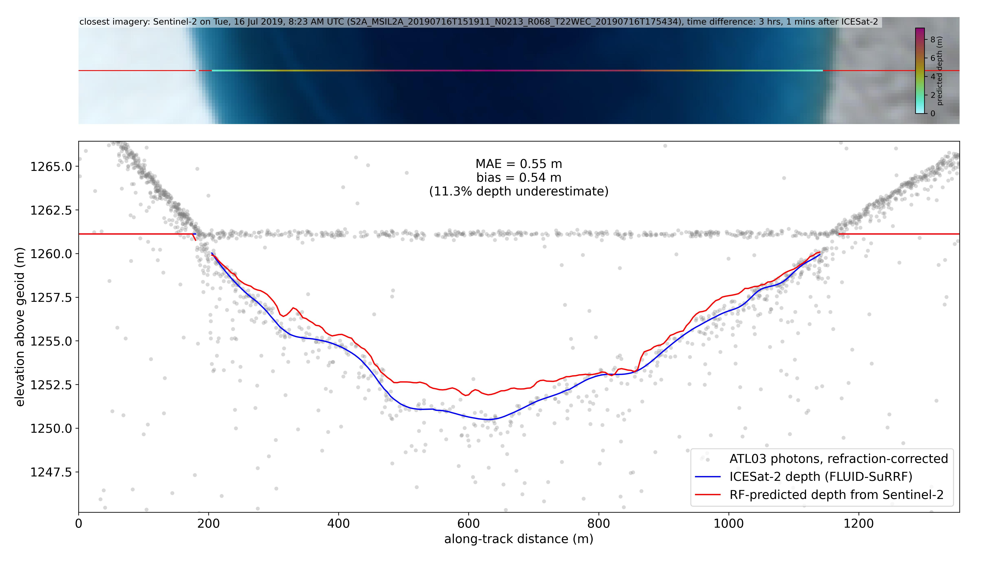

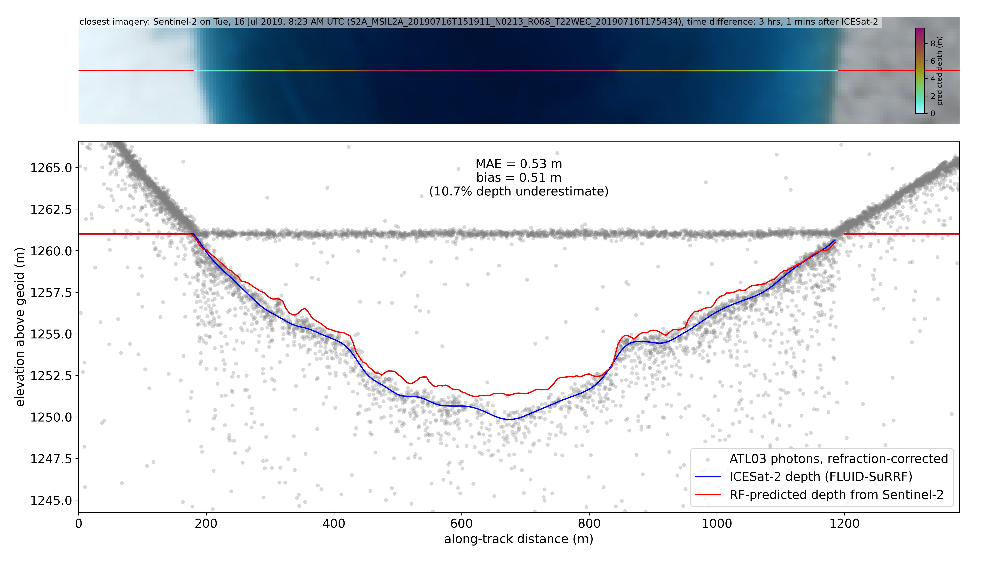

...

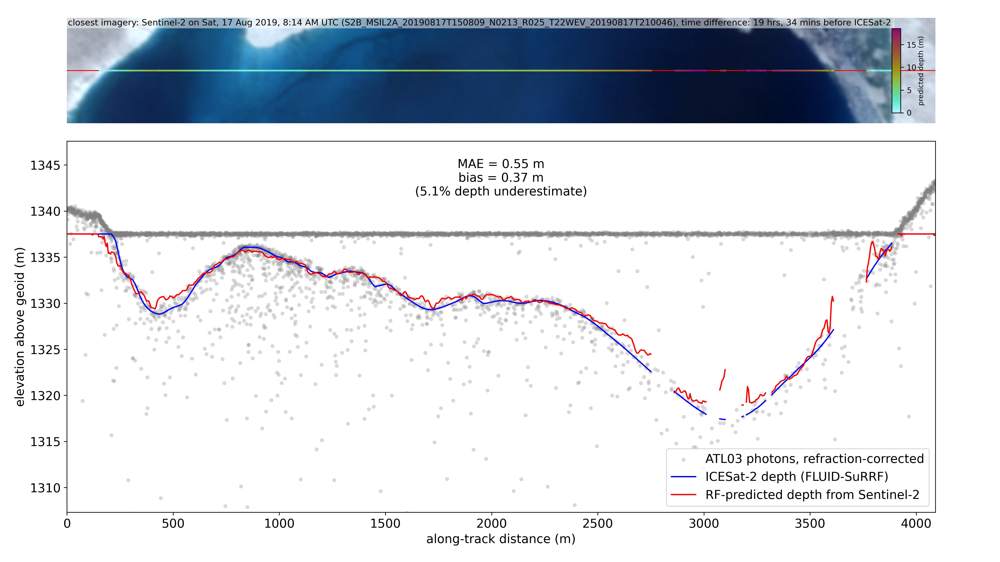

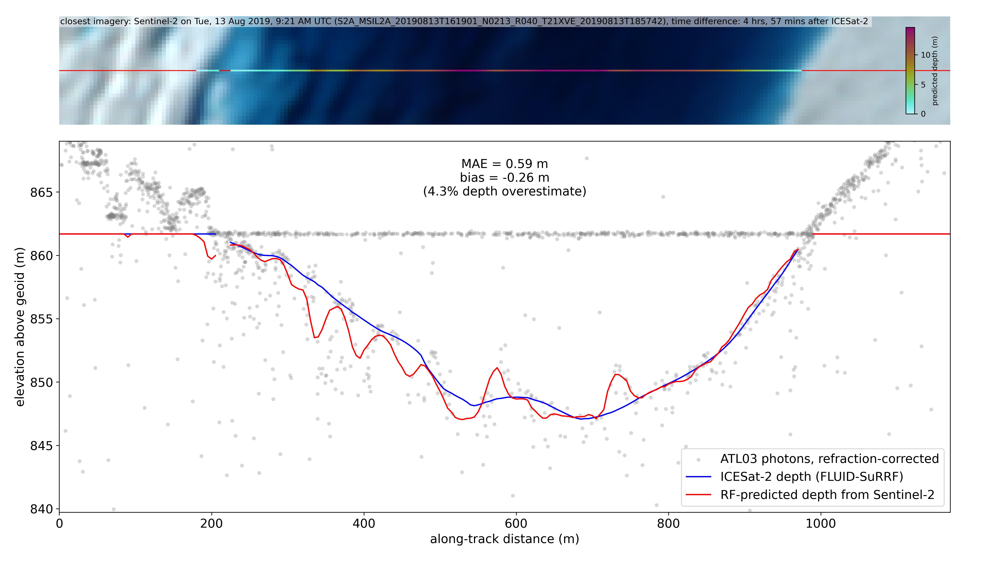

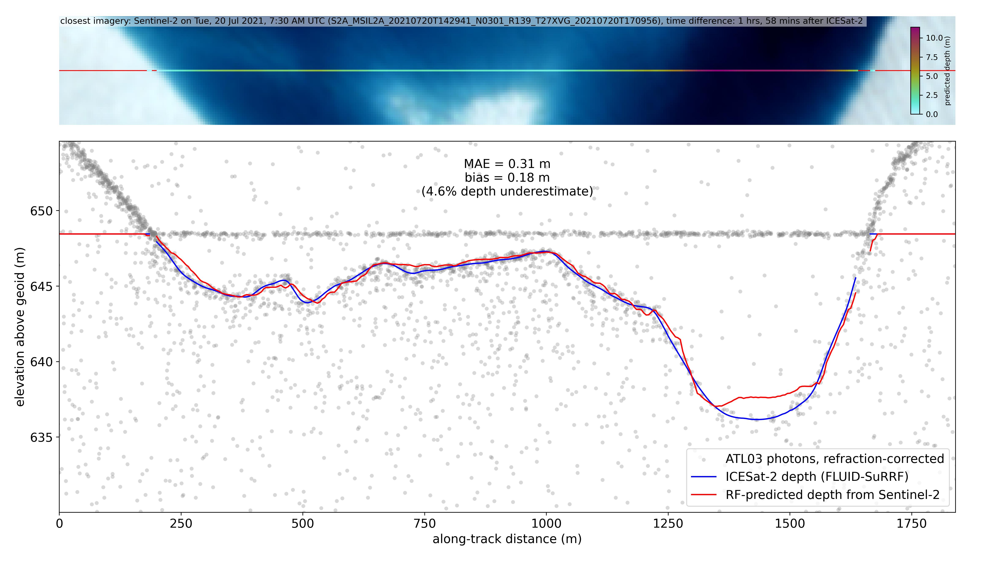

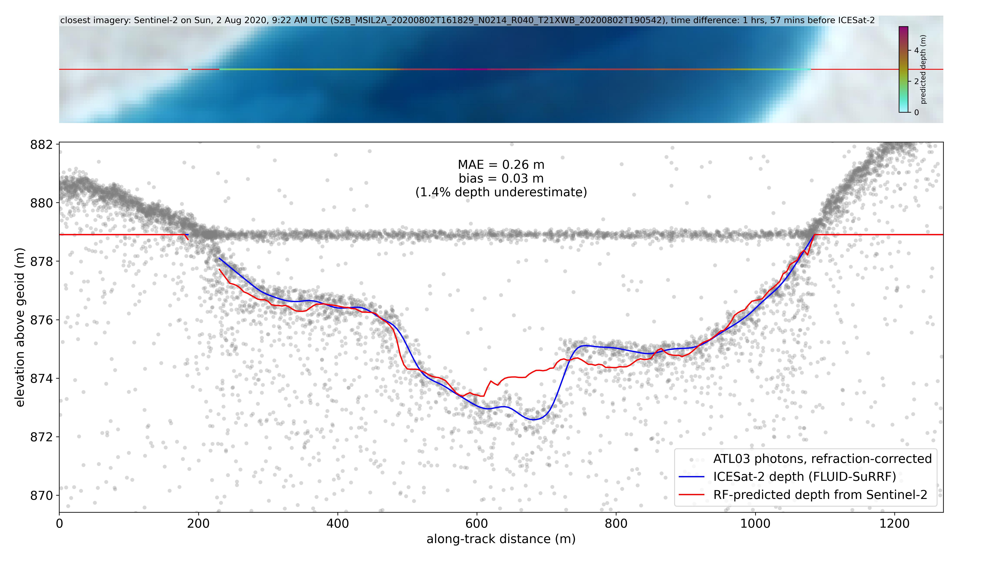

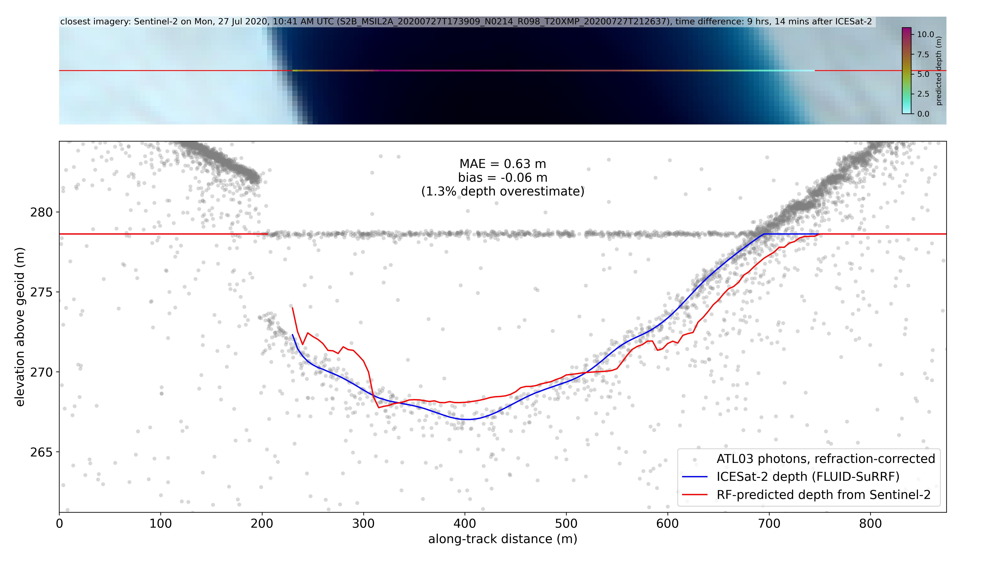

In [87]:
matplotlib.rcParams.update({'font.size': 14})
ref_idx = 1.336
for i, id in enumerate(test_ids):
    fig = plt.figure(figsize=[16, 9], dpi=60)
    gs = fig.add_gridspec(nrows=4)
    axs = [fig.add_subplot(gs[1:])]
    axs.append(fig.add_subplot(gs[0], sharex=axs[0]))
    fn_atl03 = 'atl03_segments/%s.h5' % id
    fn_img = 'imagery_gt/%s_sentinel2_rgb.tif' % id
    lk_info = df_info.loc[id]
    lk = dictobj(read_melt_lake_h5(fn_atl03))
    dfp = lk.photon_data.copy()
    h_surf = lk.surface_elevation
    dfp.loc[dfp.h<h_surf, 'h'] = h_surf - (h_surf - lk.photon_data.loc[dfp.h<h_surf, 'h']) / ref_idx
    dfd = df_result_test[df_result_test.IS2_id == id].copy()
    dfd_ = dfd.set_index('xatc')
    dfd_plot = pd.DataFrame({'xatc': np.arange(dfd_.index.min(), dfd_.index.max(), 5), 'for_plotting': True}).set_index('xatc')
    dfd_plot = dfd_plot.join(dfd_)
    dfd_plot = dfd_plot.reset_index()
    dfd_plot.loc[dfd_plot.depth_pred < 0.1, 'depth_pred'] = 0.0
    xatc_depth_pred = dfd_plot.xatc.copy()
    xatc_depth_pred[dfd_plot.depth_pred <= 0.0] = np.nan

    ax = axs[0]
    ax.scatter(dfp.xatc, dfp.h, s=20, color='gray', alpha=0.3, edgecolors='none', label='ATL03 photons, refraction-corrected')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth, 'b-', label='ICESat-2 depth (FLUID-SuRRF)')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth_pred, 'r-', label='RF-predicted depth from Sentinel-2')

    xl = (dfd_plot.xatc.min(), dfd_plot.xatc.max())
    depth_range_max = dfd_plot[['depth', 'depth_pred']].max().max()
    yl = (h_surf - depth_range_max*1.5, h_surf + depth_range_max*0.5)
    ax.set_xlim(xl)
    ax.set_ylim(yl)

    isna = dfd_plot.depth.isna() | dfd_plot.depth_pred.isna()
    this_mae = mean_absolute_error(dfd_plot.depth[~isna], dfd_plot.depth_pred[~isna])
    this_bias = np.nanmean(dfd_plot.depth[~isna] - dfd_plot.depth_pred[~isna])
    this_percent = this_bias / np.nanmean(dfd_plot.depth[~isna]) * 100
    over_under = 'depth overestimate' if this_percent < 0.0 else 'depth underestimate'
    txt = 'MAE = %.2f m\nbias = %.2f m\n(%.1f%% %s)' % (this_mae, this_bias, np.abs(this_percent), over_under)
    ax.text(0.5, 0.9, txt, ha='center', va='center', transform=ax.transAxes)

    ax.set_ylabel('elevation above geoid (m)')
    ax.set_xlabel('along-track distance (m)')
    ax.legend(loc='lower right')

    ####--------------------------------------------
    #### plot imagery
    ax = axs[1]
    ax.axis('off')

    with rio.open(fn_img) as gtImage:
            rioplot.show(gtImage, ax=ax)
            crs_img = gtImage.crs
    try:
        fn_imgprops = fn_img.replace('.tif','_props.csv')
        df_props = pd.read_csv(fn_imgprops).iloc[0]
        product_id = df_props.product_id
        datetime_print_s2 = df_props.datetime_print_s2
        tdiff_str = df_props.tdiff_str
        txt = 'closest imagery: Sentinel-2 on %s (%s), time difference: %s ' % (datetime_print_s2, product_id, tdiff_str)
        if lk_info.n_scenes > 1:
            txt += '[all: %.1f - %.1f hrs]' % (lk_info.tdiff_sec_min/3600, lk_info.tdiff_sec_max/3600)
        tbx = ax.text(0.001, 0.99, txt, transform=ax.transAxes, ha='left', va='top', fontsize=10)
        tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1.)
        tbx.set_bbox(tbbox)
    except:
        traceback.print_exc()
    
    ax.plot(dfd_plot.xatc, dfd_plot.xatc*0.0, 'r-', lw=1)

    data = pd.DataFrame({'x': xatc_depth_pred, 'y': xatc_depth_pred*0.0, 'c': dfd_plot.depth_pred})
    cmap = cmc.hawaii_r
    points = np.array([data.x, data.y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap)
    lc.set_array(data.c)
    lc.set_linewidth(2)
    ax.add_collection(lc)

    cax = ax.inset_axes([0.95, 0.1, 0.01, 0.8])
    cbar = plt.colorbar(lc, cax=cax, orientation='vertical')
    cbar.set_label('predicted depth (m)', fontsize=8, labelpad=1.5)
    cax.tick_params(axis='both', which='major', labelsize=9)
    #cb = fig.colorbar(lc, ax=ax, label='line color')
    #ax.plot(xatc_depth_pred, xatc_depth_pred*0.0, 'r-')
    # ax.plot([intersection_pts.xatc.min(), intersection_pts.xatc.max()], [0, 0], 'r-')
    # ax.axis('off')
    axbbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    axis_aspect = axbbox.width/axbbox.height
    yl_img_pm = dfd_plot.xatc.max() / axis_aspect / 2
    ax.set_ylim((-yl_img_pm, yl_img_pm))

    fig.tight_layout()

    fig_out_fn = 'test_lakes_plots/%s_test.jpg' % id
    fig.savefig(fig_out_fn, dpi=300)
    plt.close(fig)
    display(Image(fig_out_fn))